# TERRA - Network Analysis

### Import libraries

In [27]:
import os
from dotenv import load_dotenv

from sqlalchemy import create_engine
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from datetime import datetime
import networkx as nx

load_dotenv()

True

### DB Connection setup

In [2]:
conn_str = f'mssql+pyodbc://{os.getenv("DB_USER", "")}:{os.getenv("DB_PASS", "")}@{os.getenv("DB_SERVER", "")}/{os.getenv("DB_NAME", "")}?driver={os.getenv("DB_DRIVER", "")}'
engine = create_engine(conn_str)
db_schema = 'lab'
db_cpa_table = 'v_cpa_extra_single_node'
db_nstr_table = 'v_nstr_extra_single_node'
db_cpa_desc_table = 'z_dim_cpa_desc'

### Read table

In [3]:
cpa_df = pd.read_sql_table(table_name = db_cpa_table, schema = db_schema, con = engine)
cpa_desc_df = pd.read_sql_table(table_name = db_cpa_desc_table, schema = db_schema, con = engine)
#nstr_table = pd.read_sql_table(table_name = db_nstr_table, schema = db_schema, con = engine)

### Params

In [4]:
cpa_product = list(cpa_desc_df["PRODUCT"])

# lista dei 10 prodotti che generano più indotto
#cpa_product = list(cpa_df[cpa_df.PRODUCT!="TOT"].groupby("PRODUCT")["AVG_VALUE_IN_EUROS"].sum().reset_index().sort_values("AVG_VALUE_IN_EUROS",ascending=False)[:10]["PRODUCT"]) #'291'

In [5]:
cpa_df_filtered = cpa_df[(cpa_df.PRODUCT.isin(cpa_product))].merge(cpa_desc_df,how="inner",on="PRODUCT")

In [21]:
cpa_df_filtered_group = cpa_df_filtered.groupby(['PERIOD','PRODUCT'])

### Graph
Here is a list of measures calculated on each graphs:

<b>Overall measures</b>
-  <u>Density</u>: # of edges / # of possible edges

<b>Node-based measures</b>:
- <u>Degree</u>: # of adjacent edges. it can be divided in two measures: in-degree and out-degree. for weighted graph, the sum of the edges weights is considered
- <u>Betweennees centrlity</u>: # of shortest paths that include that node / number of shortest paths. For weighted graph, consider the inverse of the weight as it is considered distance.
- <u>Closeness centrality</u>: # of nodes reachable from it / the sum of the minimum distances of all nodes reachable from it. For weighted graph, consider the inverse of the weight as it is considered distance.
- <u>Eigenvector centrality</u>: the centrality of a node by adding the centrality of its predecessors
- <u>Constraint</u>: to understand
- <u>Effective size</u>: ego netowrk size - the average degree of the other ego nodes

<b>Edge-based measures</b>:
- <u>Edge betweennees centrlity</u>: betweenness centrality for edges

In [22]:
graph_list = []
for grp, data in cpa_df_filtered_group:
    G = nx.DiGraph()
    for index, row in data.iterrows():
        # weigh 1/value
        G.add_edge(row['DECLARANT_ISO'], row['PARTNER_ISO'], weight=1/row['AVG_VALUE_IN_EUROS'] if row['AVG_VALUE_IN_EUROS']!=0 else 0)
    UG = G.to_undirected()
    graph_list.append((grp[0],grp[1],G,UG))

In [24]:
ts_density = []
ts_betw_cen = []
ts_weigh_betw_cen = []
ts_edge_betw_cen = []
ts_clique = []

for i in graph_list:
    ts_density.append((i[0],i[1],nx.density(i[2])))
    
    betw_cen = pd.DataFrame(list(nx.betweenness_centrality(i[2]).items()),columns =['Country','bc']).sort_values("bc",ascending=False)[:10]
    betw_cen["time"] = datetime.strptime(str(i[0]), '%Y%m')
    betw_cen["product"] = i[1]
    ts_betw_cen.append(betw_cen)

    weigh_betw_cen = pd.DataFrame(list(nx.betweenness_centrality(i[2], weight='weight').items()),columns =['Country','bc']).sort_values("bc",ascending=False)[:10]
    weigh_betw_cen["time"] = datetime.strptime(str(i[0]), '%Y%m')
    weigh_betw_cen["product"] = i[1]
    ts_weigh_betw_cen.append(weigh_betw_cen)
    
    edge_betw_cen = pd.DataFrame(list(nx.edge_betweenness_centrality(i[2], weight='weight').items()),columns =['Edge','bc']).sort_values("bc",ascending=False)[:10]
    edge_betw_cen["time"] = datetime.strptime(str(i[0]), '%Y%m')
    edge_betw_cen["product"] = i[1]
    ts_edge_betw_cen.append(edge_betw_cen)

    clique = (datetime.strptime(str(i[0]), '%Y%m'), i[1], i[2].subgraph(max(nx.find_cliques(i[3]),key=len)))
    ts_clique.append(clique)
    
ts_density = pd.DataFrame(ts_density,columns=["time","product","density"])
ts_betw_cen = pd.concat(ts_betw_cen)
ts_weigh_betw_cen = pd.concat(ts_weigh_betw_cen)
ts_edge_betw_cen = pd.concat(ts_edge_betw_cen)

In [47]:
for prod in cpa_product:

    time_series = ts_density[ts_density['product']==prod].sort_values("time")["density"]

    # Calculate the rolling mean and standard deviation
    rolling_mean = time_series.rolling(window=3).mean()
    rolling_std = time_series.rolling(window=3).std()

    # Compute the Z-score
    z_score = (time_series - rolling_mean) / rolling_std

    # Threshold for detecting significant changes (e.g., 3 standard deviations)
    threshold = 1.1
    anomalies = time_series[np.abs(z_score) > threshold]

    if len(anomalies>0):
        print("Anomalies detected at indices:")
        print(anomalies.index)
        plt.figure(figsize=(14, 7))
        plt.plot(time_series, label='Time Series')

Anomalies detected at indices:
Index([215], dtype='int64')
Anomalies detected at indices:
Index([216], dtype='int64')
Anomalies detected at indices:
Index([218, 432], dtype='int64')
Anomalies detected at indices:
Index([328, 435], dtype='int64')
Anomalies detected at indices:
Index([329], dtype='int64')
Anomalies detected at indices:
Index([437], dtype='int64')
Anomalies detected at indices:
Index([225, 439], dtype='int64')
Anomalies detected at indices:
Index([333], dtype='int64')
Anomalies detected at indices:
Index([228, 549], dtype='int64')
Anomalies detected at indices:
Index([231, 445], dtype='int64')
Anomalies detected at indices:
Index([339], dtype='int64')
Anomalies detected at indices:
Index([447], dtype='int64')
Anomalies detected at indices:
Index([234, 341, 555], dtype='int64')
Anomalies detected at indices:
Index([343], dtype='int64')
Anomalies detected at indices:
Index([237], dtype='int64')
Anomalies detected at indices:
Index([559], dtype='int64')
Anomalies detected at

C:\Users\UTENTE\AppData\Local\Temp\ipykernel_15556\3963438862.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(14, 7))


Anomalies detected at indices:
Index([261, 475], dtype='int64')
Anomalies detected at indices:
Index([371, 585], dtype='int64')
Anomalies detected at indices:
Index([266, 480], dtype='int64')
Anomalies detected at indices:
Index([374], dtype='int64')
Anomalies detected at indices:
Index([483], dtype='int64')
Anomalies detected at indices:
Index([378], dtype='int64')
Anomalies detected at indices:
Index([593], dtype='int64')
Anomalies detected at indices:
Index([382], dtype='int64')
Anomalies detected at indices:
Index([276, 383, 597], dtype='int64')
Anomalies detected at indices:
Index([278], dtype='int64')
Anomalies detected at indices:
Index([279, 493], dtype='int64')
Anomalies detected at indices:
Index([388], dtype='int64')
Anomalies detected at indices:
Index([497], dtype='int64')
Anomalies detected at indices:
Index([392, 606], dtype='int64')
Anomalies detected at indices:
Index([395], dtype='int64')
Anomalies detected at indices:
Index([292, 613], dtype='int64')
Anomalies detect

### Visualization

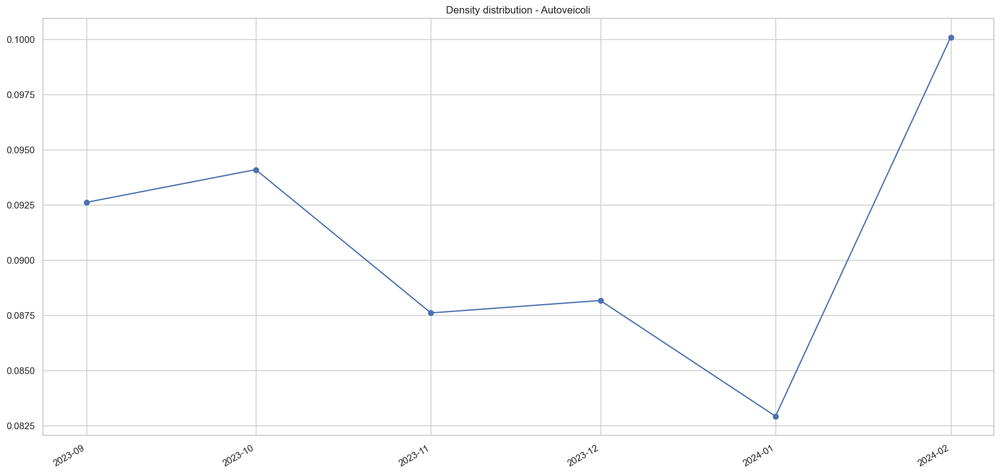

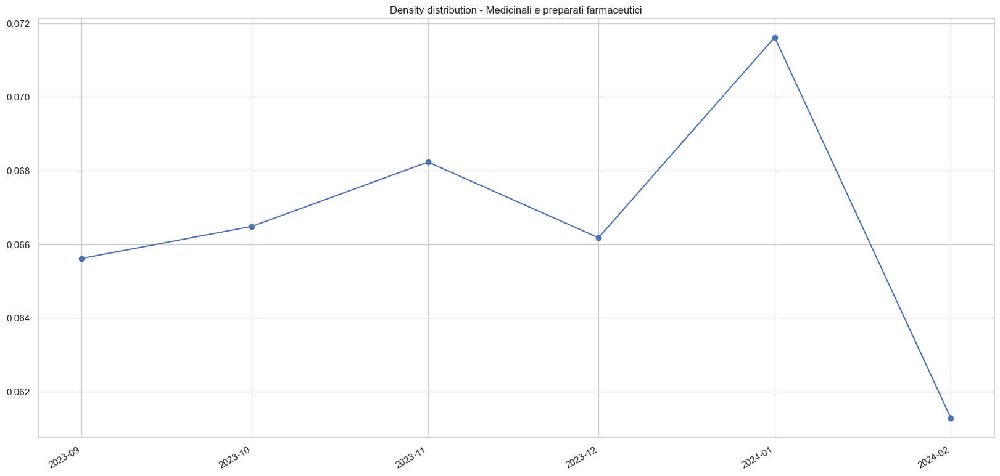

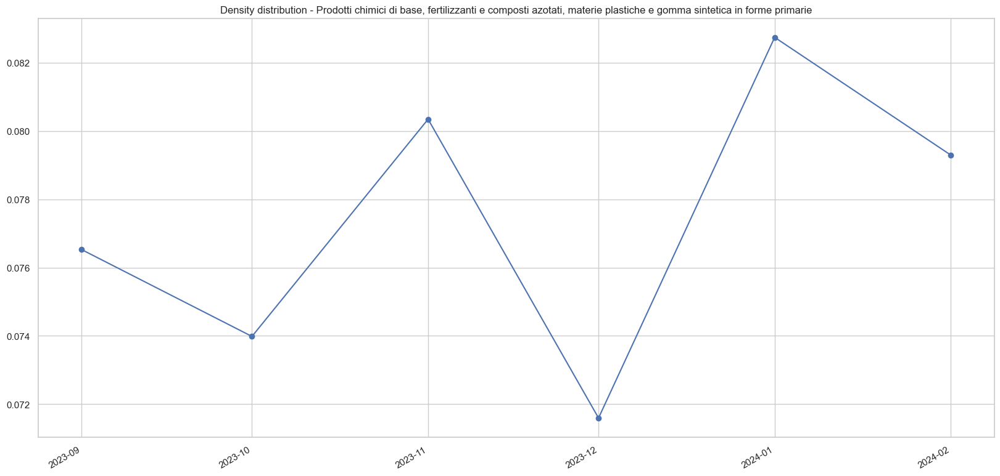

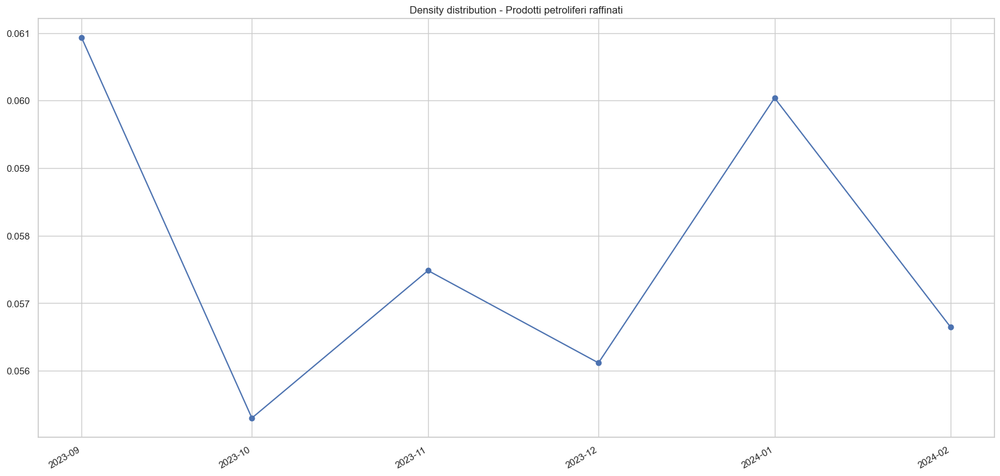

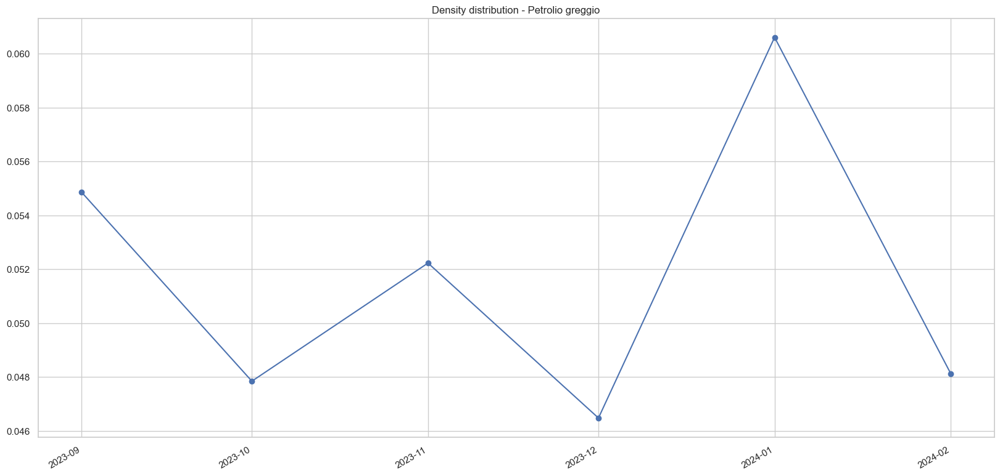

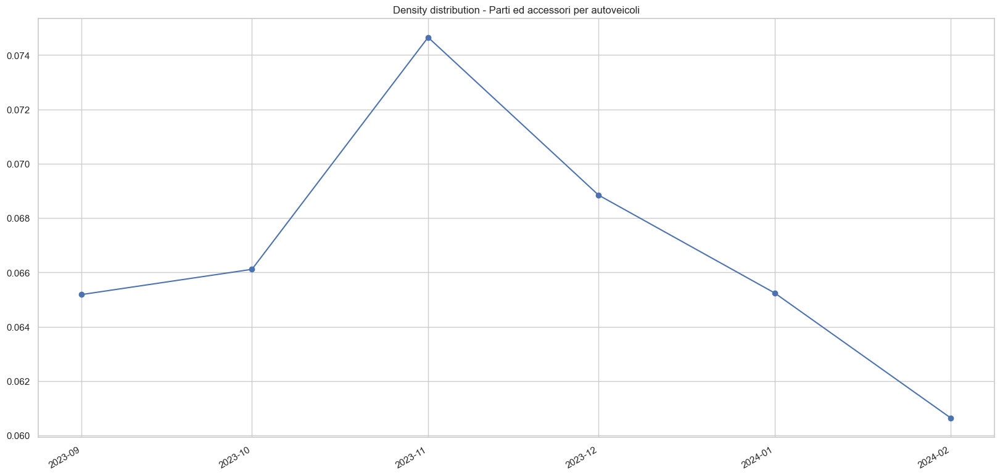

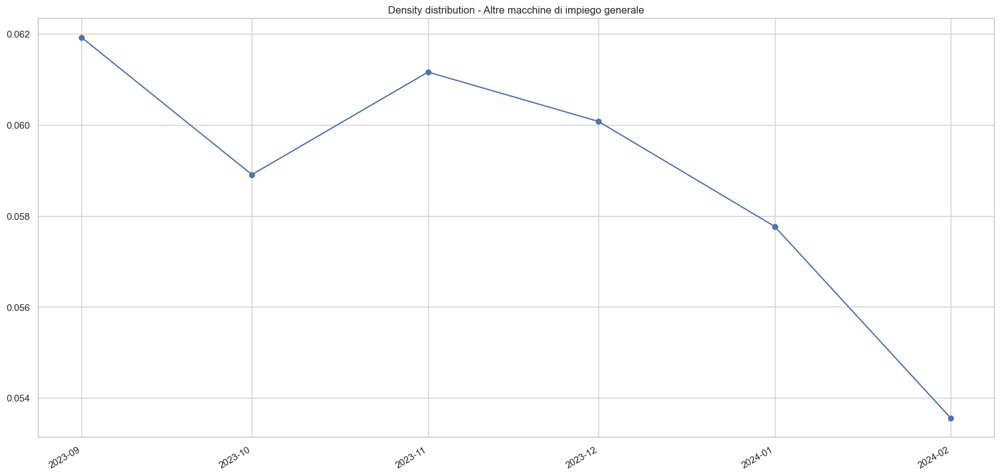

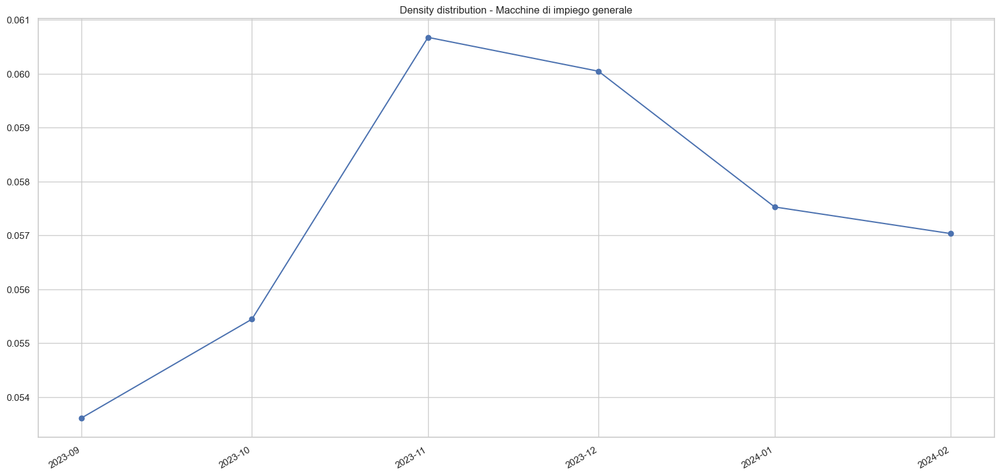

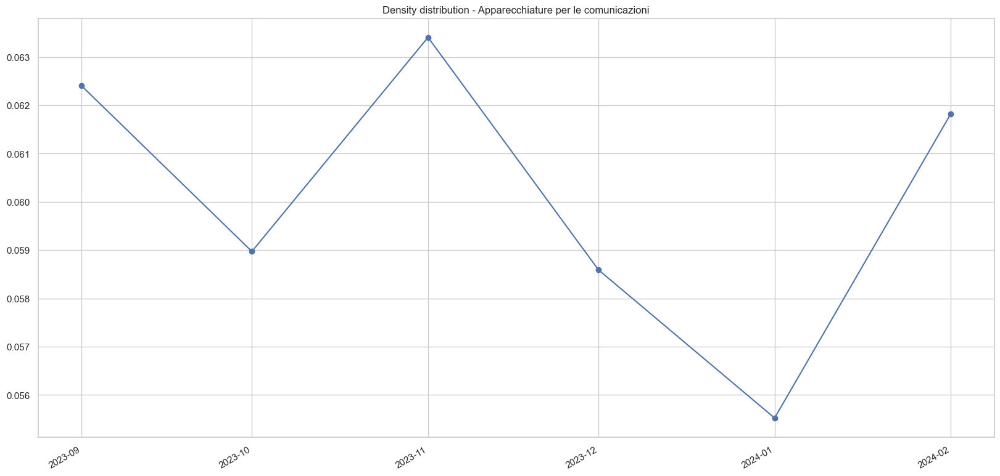

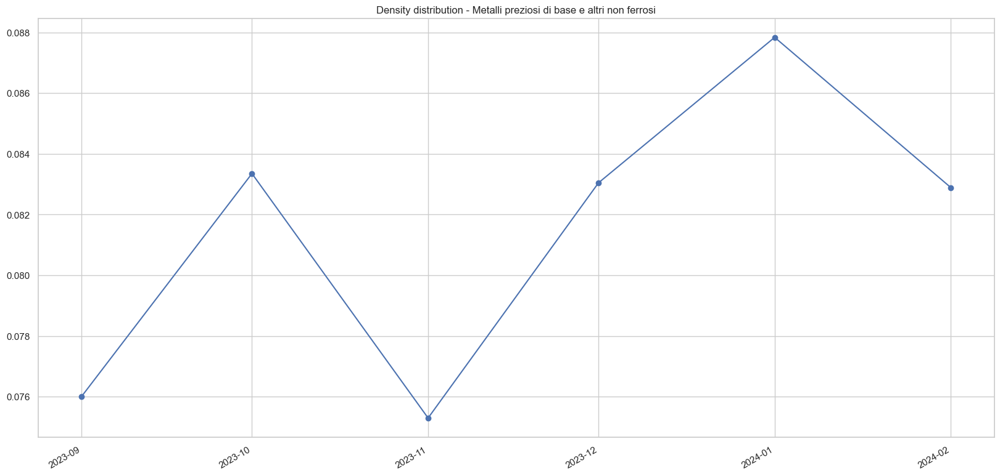

In [98]:
for prod in cpa_product:
    fig, ax = plt.subplots(figsize=(20, 10)) 
    ts_density_filter = ts_density[ts_density["product"] == prod]
    dates =[datetime.strptime(str(x), '%Y%m') for x in list(ts_density_filter["time"])]
    values = [x for x in list(ts_density_filter["density"])]
    ax.plot(dates, values, 'o-')
    ax.set_title(f"Density distribution - {list(cpa_desc_df[cpa_desc_df.PRODUCT==prod]['PROD_DESCR'])[0]}")
    fig.autofmt_xdate()

    plt.show()

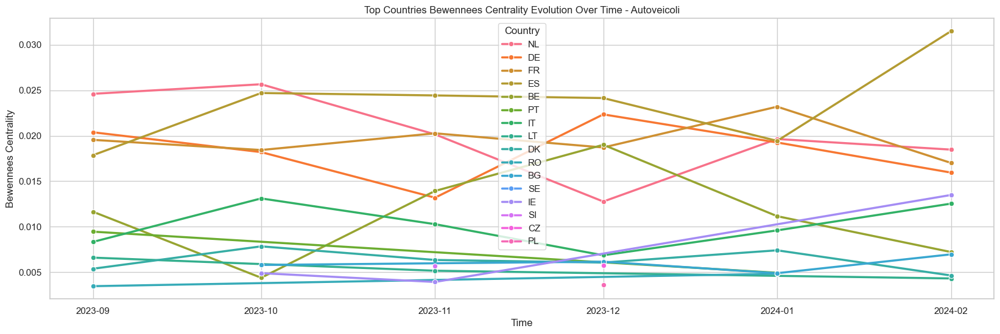

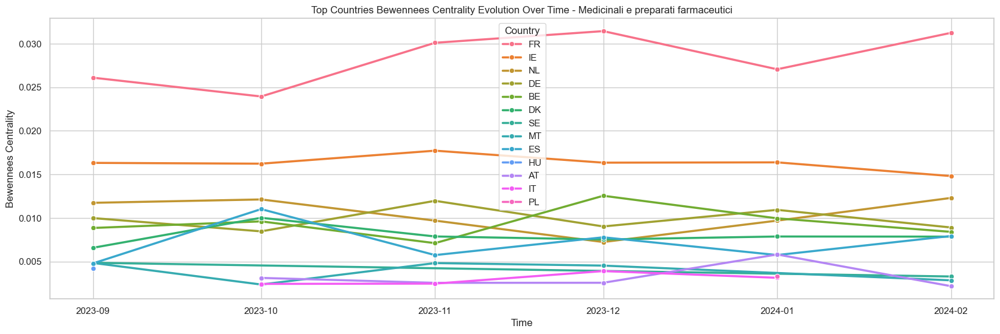

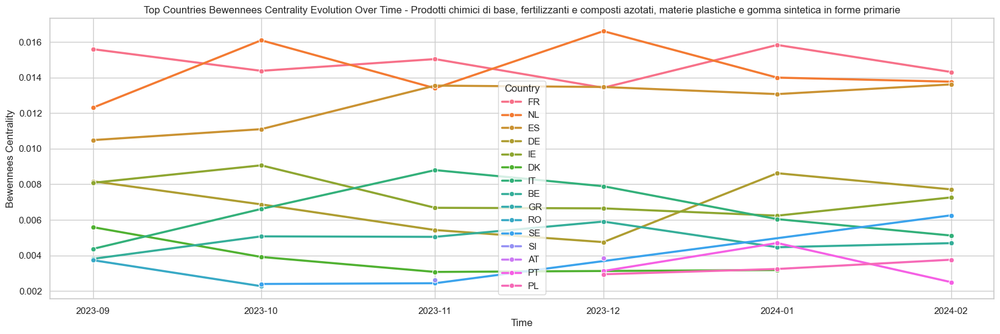

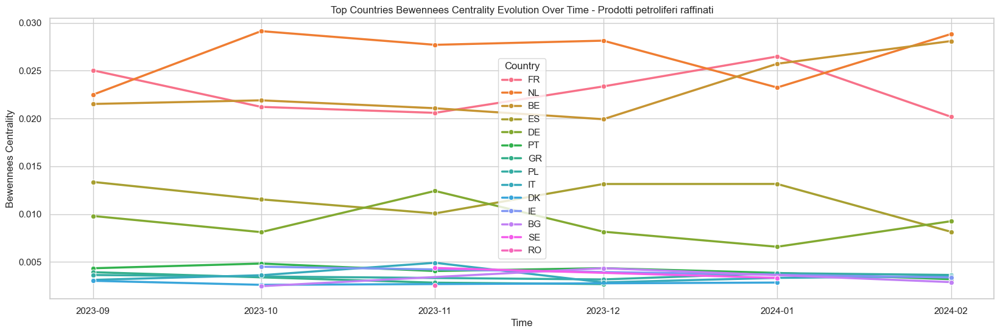

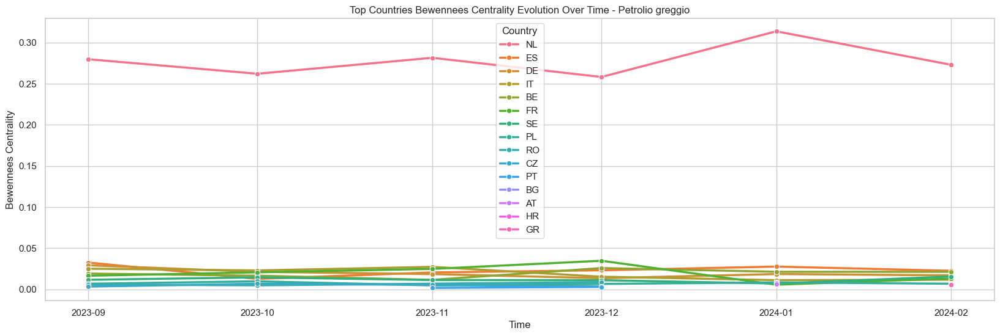

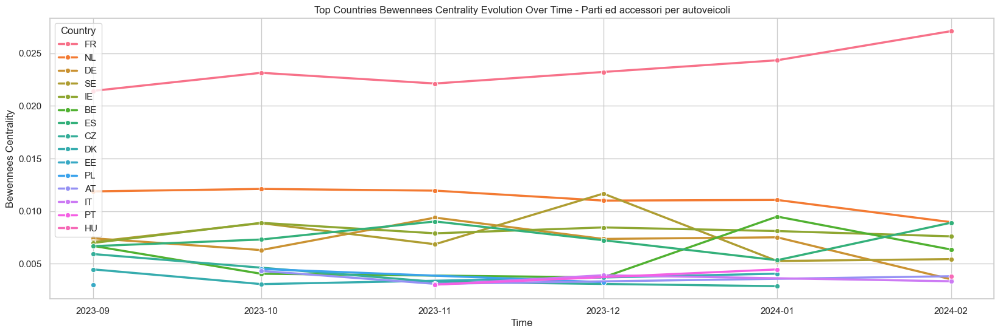

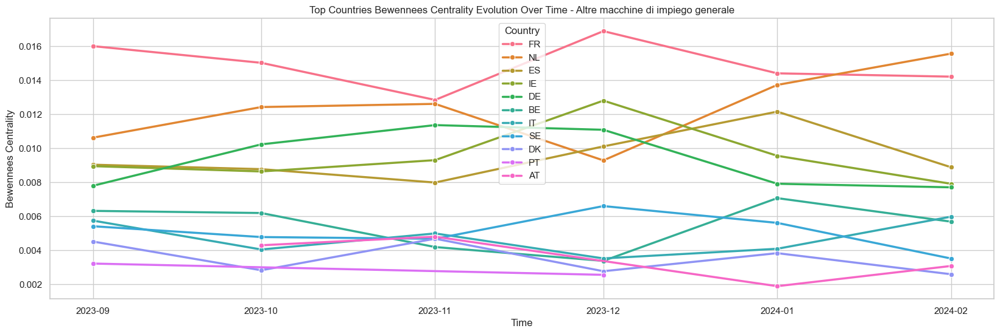

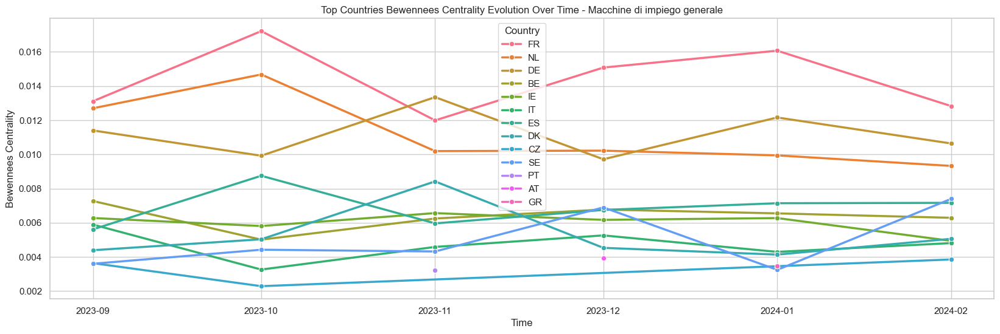

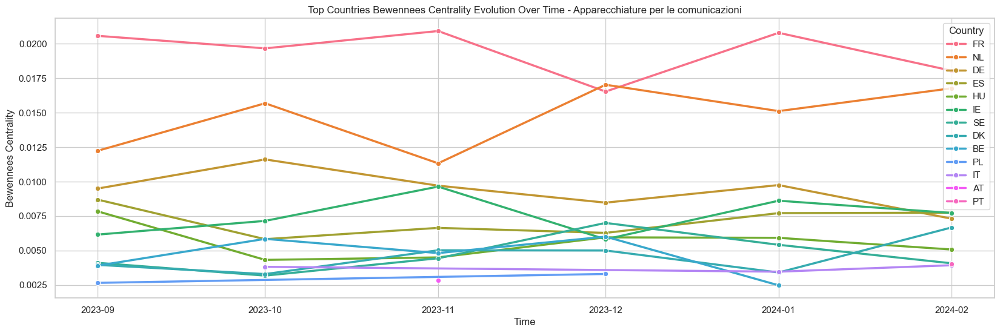

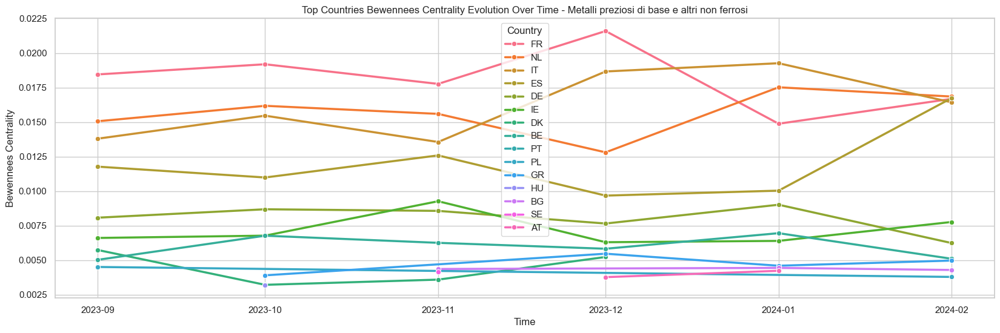

In [100]:
sns.set_theme(style="whitegrid")

for prod in cpa_product:
    plt.figure(figsize=(20, 6))
    ts_betw_cen_filter = ts_betw_cen[ts_betw_cen["product"] == prod]

    sns.lineplot(data=ts_betw_cen_filter, x='time', y='bc', hue='Country', marker='o', linewidth=2.5)

    plt.title(f"Top Countries Bewennees Centrality Evolution Over Time - {list(cpa_desc_df[cpa_desc_df.PRODUCT==prod]['PROD_DESCR'])[0]}")
    plt.xlabel('Time')
    plt.ylabel('Bewennees Centrality')

    plt.show()

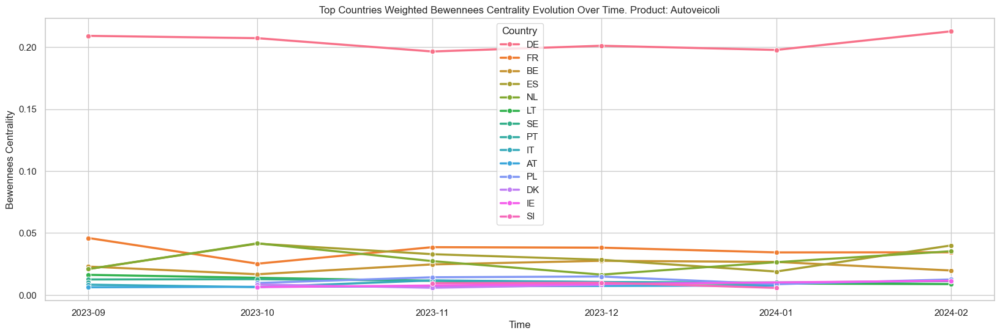

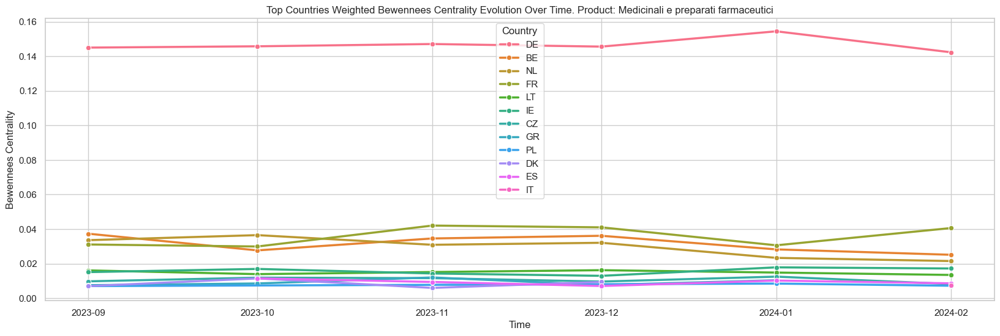

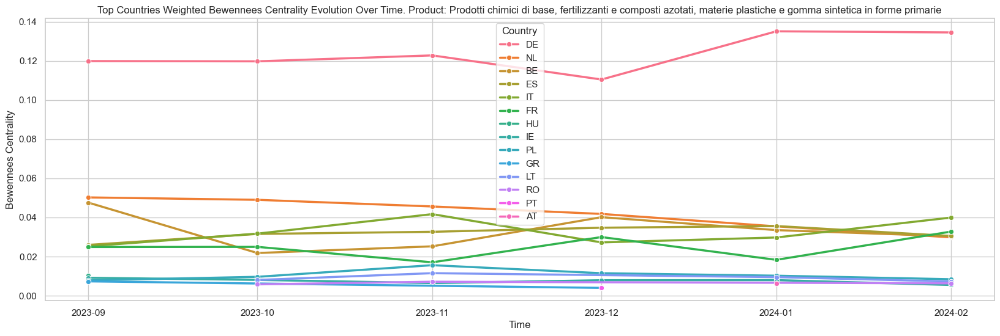

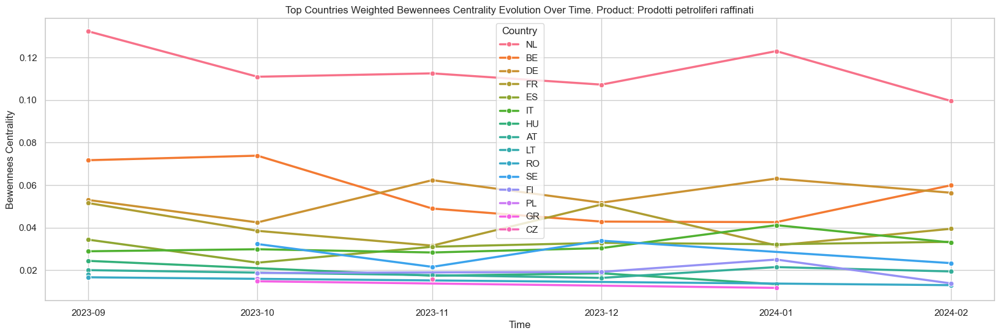

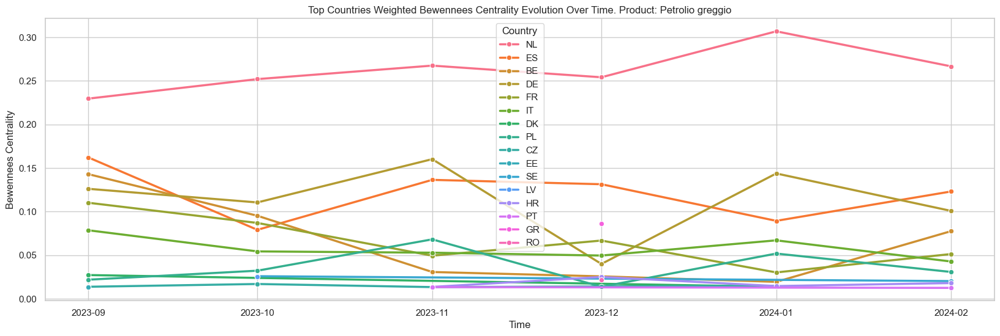

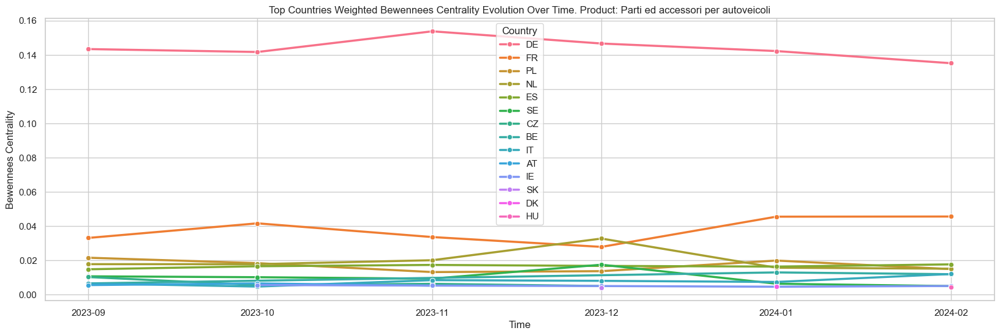

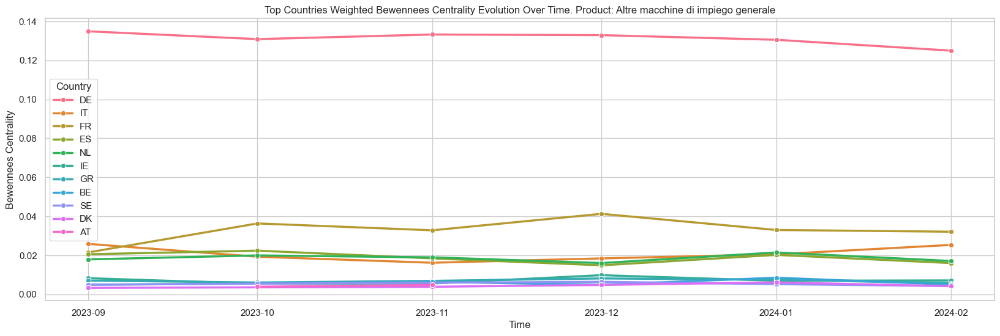

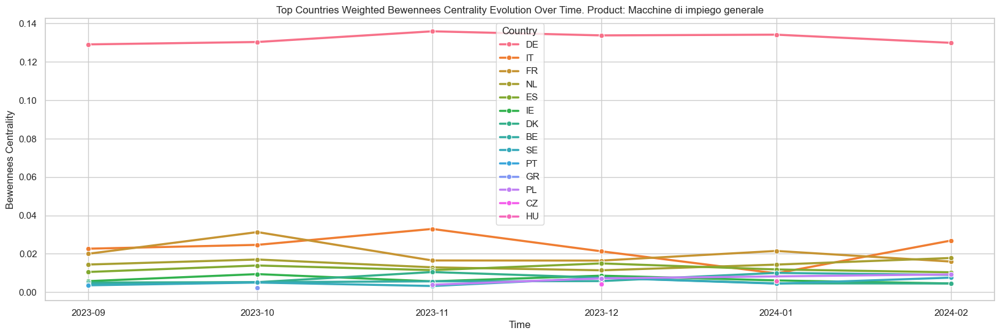

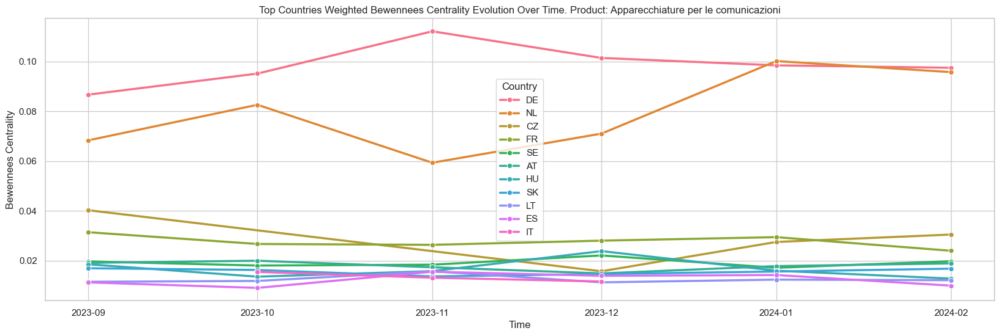

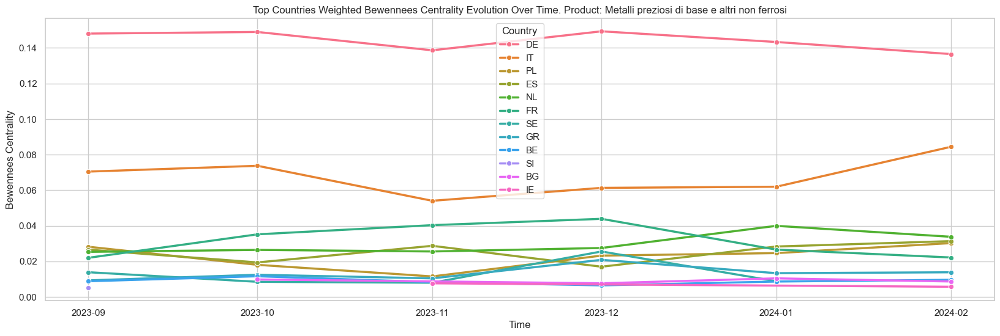

In [101]:
sns.set_theme(style="whitegrid")

for prod in cpa_product:
    plt.figure(figsize=(20, 6))
    ts_weigh_betw_cen_filter = ts_weigh_betw_cen[ts_weigh_betw_cen["product"] == prod]

    sns.lineplot(data=ts_weigh_betw_cen_filter, x='time', y='bc', hue='Country', marker='o', linewidth=2.5)

    plt.title(f"Top Countries Weighted Bewennees Centrality Evolution Over Time. Product: {list(cpa_desc_df[cpa_desc_df.PRODUCT==prod]['PROD_DESCR'])[0]}")
    plt.xlabel('Time')
    plt.ylabel('Bewennees Centrality')

    plt.show()

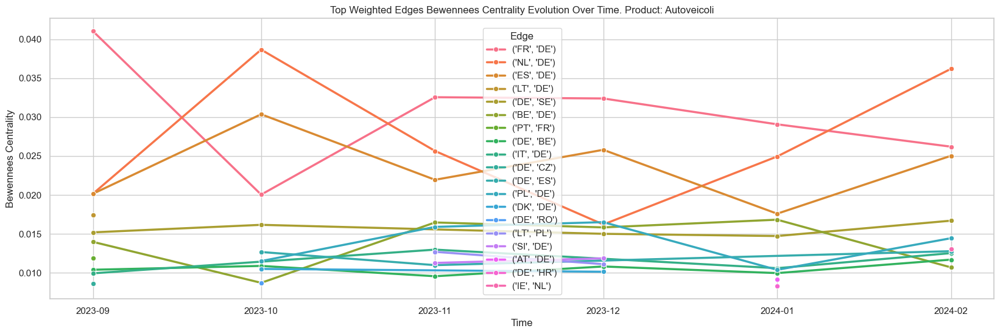

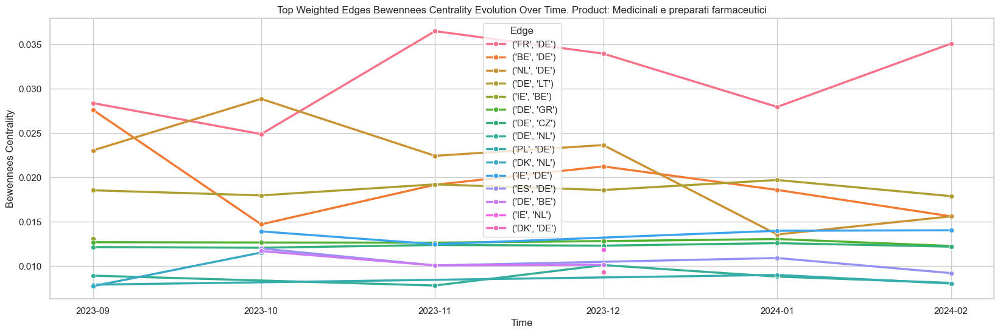

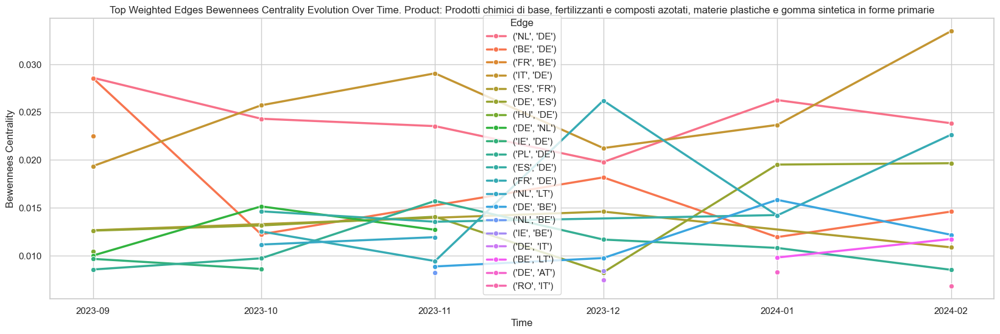

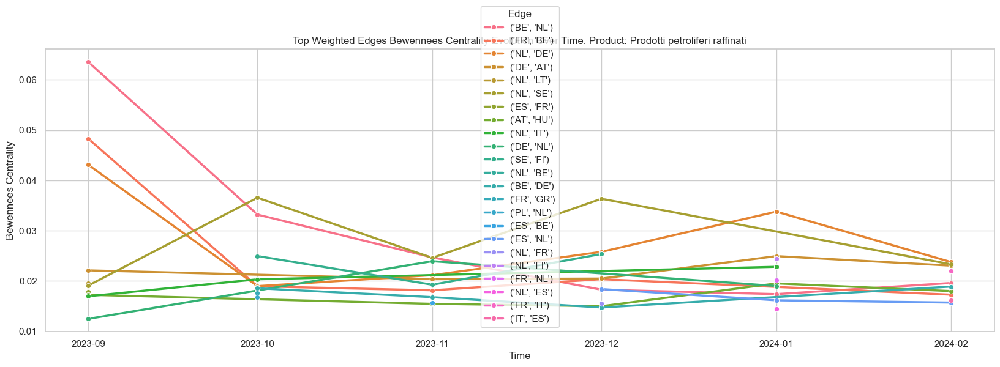

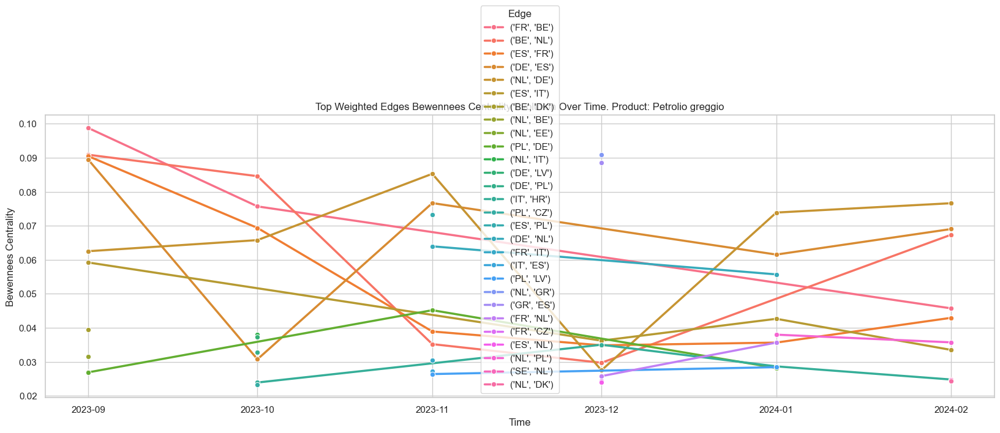

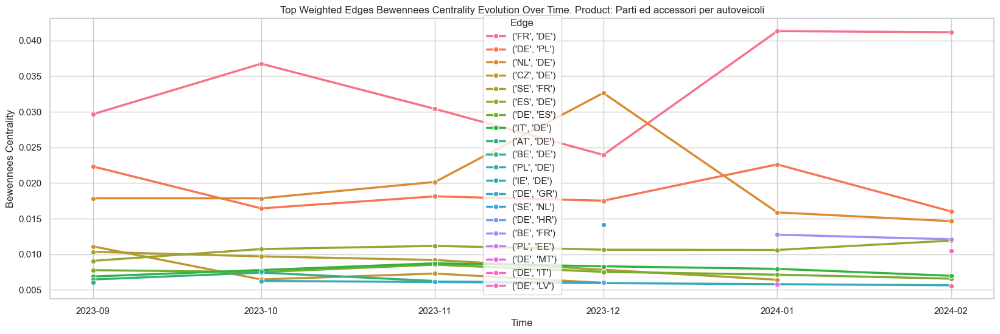

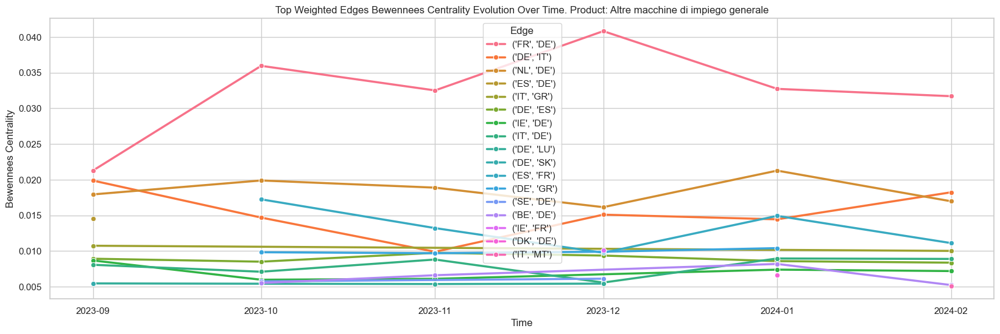

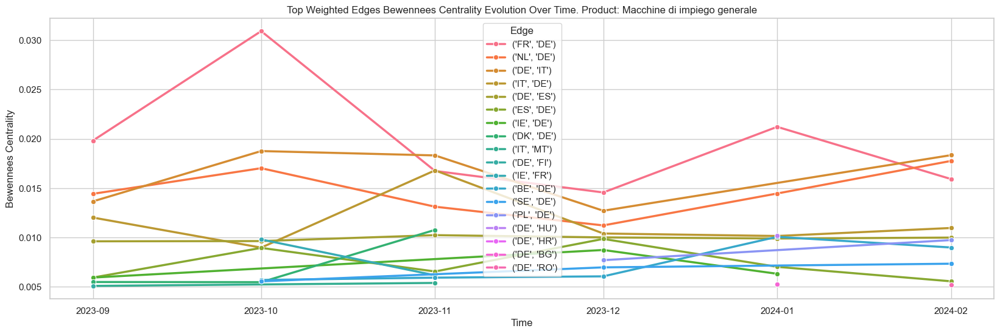

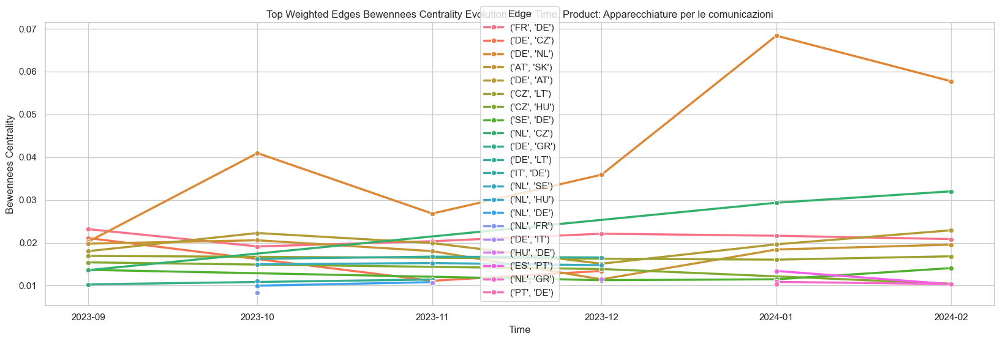

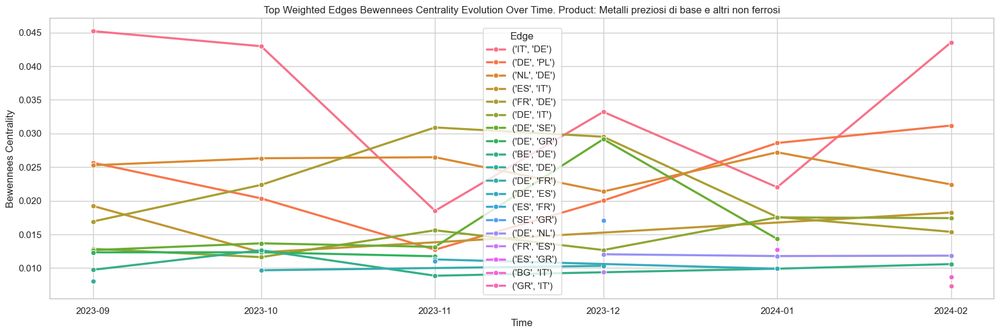

In [102]:
sns.set_theme(style="whitegrid")

for prod in cpa_product:
    plt.figure(figsize=(20, 6))
    ts_edge_betw_cen_filter = ts_edge_betw_cen[ts_edge_betw_cen["product"] == prod]
    
    sns.lineplot(data=ts_edge_betw_cen_filter, x='time', y='bc', hue='Edge', marker='o', linewidth=2.5)

    plt.title(f"Top Weighted Edges Bewennees Centrality Evolution Over Time. Product: {list(cpa_desc_df[cpa_desc_df.PRODUCT==prod]['PROD_DESCR'])[0]}")
    plt.xlabel('Time')
    plt.ylabel('Bewennees Centrality')

    plt.show()

Max clique - Autoveicoli


<Figure size 640x480 with 0 Axes>

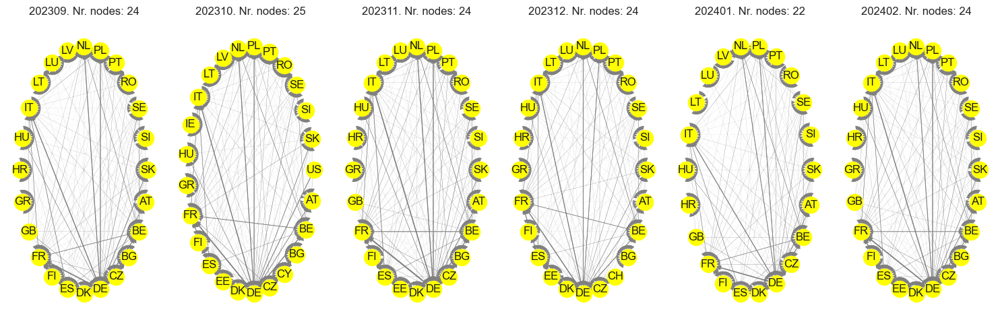

Max clique - Medicinali e preparati farmaceutici


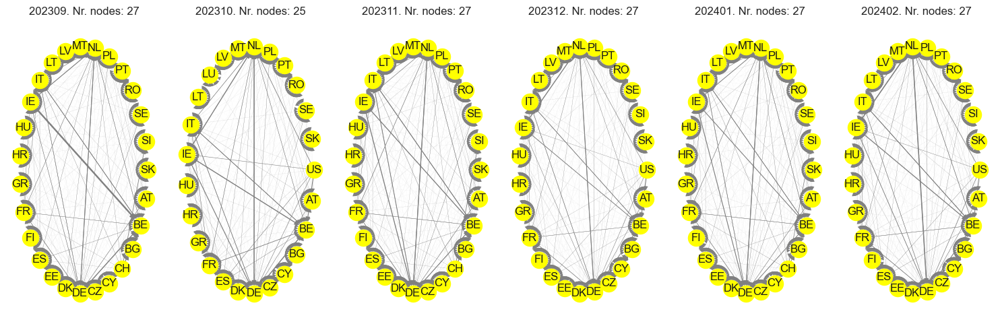

Max clique - Prodotti chimici di base, fertilizzanti e composti azotati, materie plastiche e gomma sintetica in forme primarie


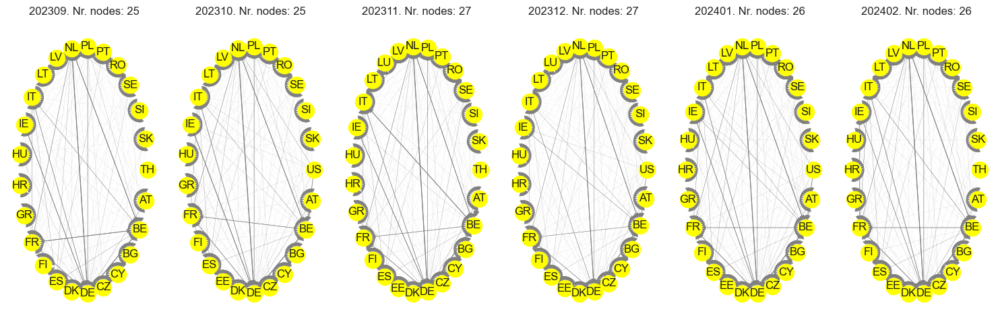

Max clique - Prodotti petroliferi raffinati


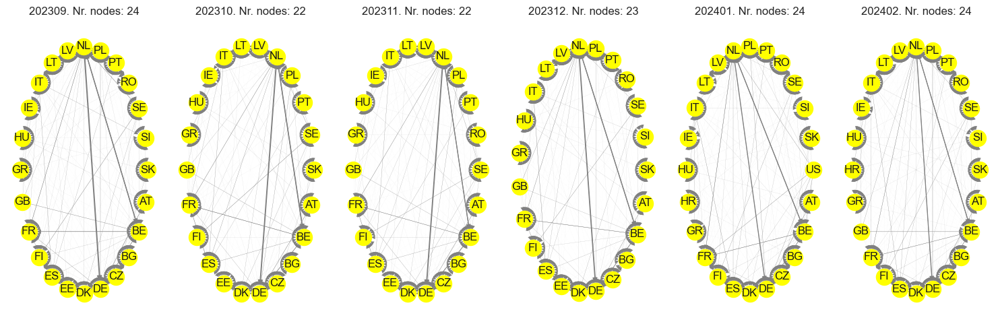

Max clique - Petrolio greggio


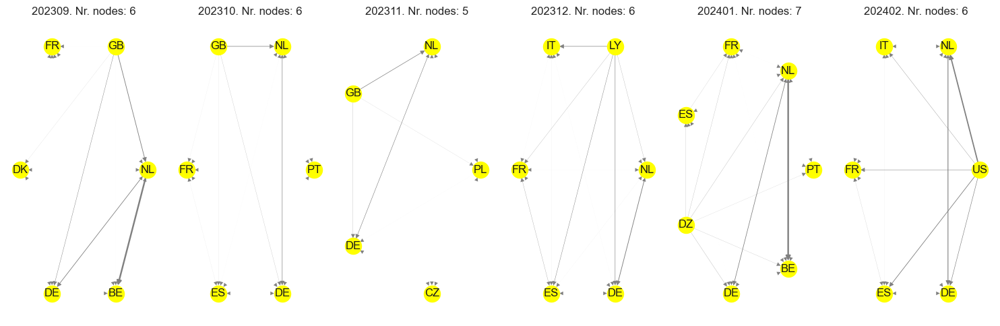

Max clique - Parti ed accessori per autoveicoli


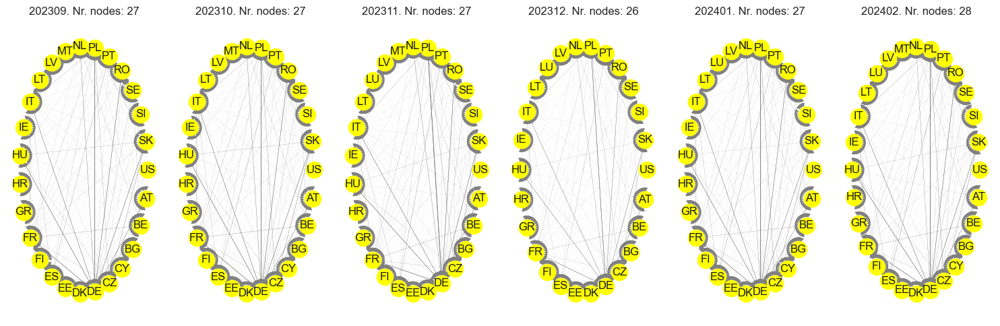

Max clique - Altre macchine di impiego generale


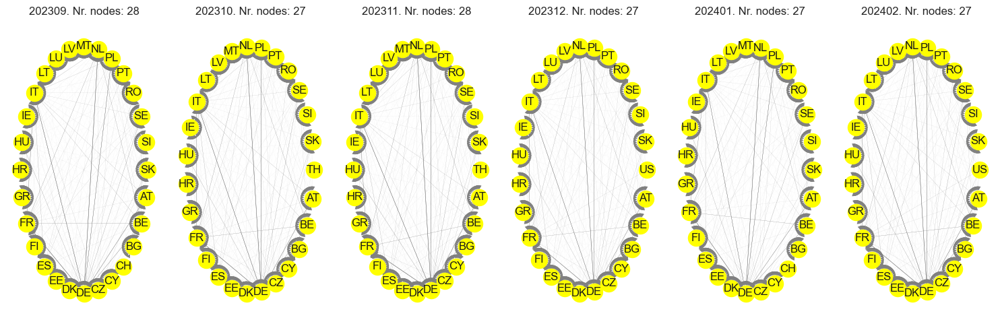

Max clique - Macchine di impiego generale


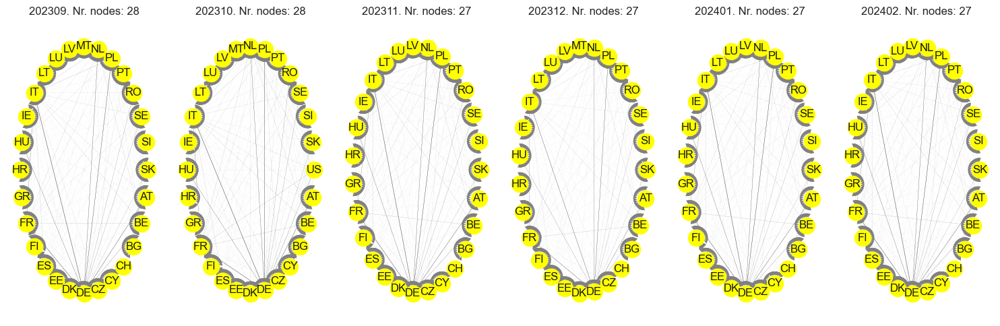

Max clique - Apparecchiature per le comunicazioni


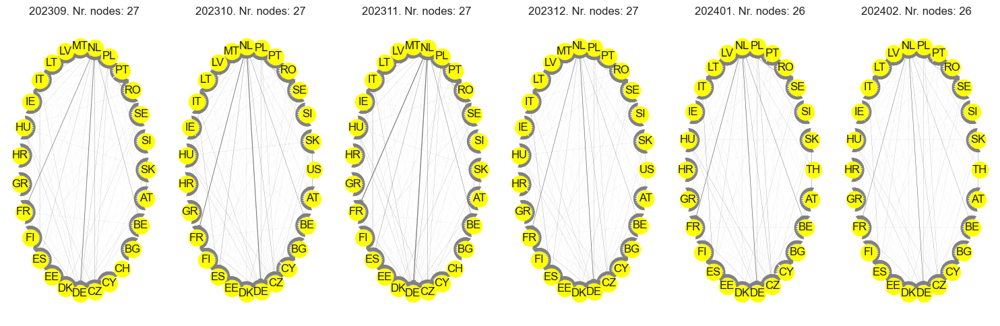

Max clique - Metalli preziosi di base e altri non ferrosi


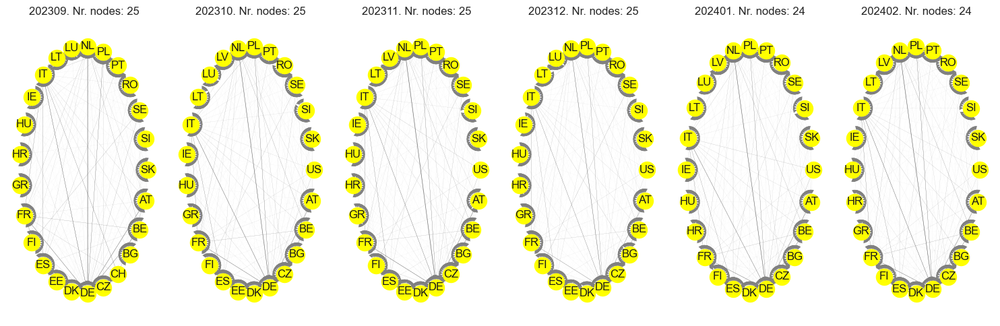

In [106]:
fig = plt.figure()
for prod in cpa_product:
    cliques = [(i[0],i[2]) for i in ts_clique if i[1]==prod]
    fig, axes = plt.subplots(1, len(cliques), figsize=(15, 5))
    print(f"Max clique - {list(cpa_desc_df[cpa_desc_df.PRODUCT==prod]['PROD_DESCR'])[0]}")
    for i, clique in enumerate(cliques):
        netw = clique[1]
        pos = nx.circular_layout(sorted(netw.nodes(), reverse=True))
        edges = netw.edges()
        weights = [(1/netw[u][v]['weight'])/1000000000 if netw[u][v]['weight'] >0 else 0 for u,v in edges]

        a=nx.draw(
            netw
            ,pos
            ,with_labels=True
            ,node_color='yellow'
            ,edge_color='grey'
            ,width=weights
            ,ax=axes[i]
        )
        #a=nx.draw_networkx_edge_labels(
        #    netw
        #    ,pos
        #    ,edge_labels=nx.get_edge_attributes(netw,'weight')
        #    ,font_color="red"
        #    ,label_pos=0.15
        #    ,ax=axes[i]
        #)
        axes[i].set_title(f'{clique[0].year*100+clique[0].month}. Nr. nodes: {len(netw.nodes())}')
    plt.tight_layout()
    plt.show()